In [90]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/data-eng-salary-2024/Dataset salary 2024.csv


In [91]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [92]:
df=pd.read_csv('/kaggle/input/data-eng-salary-2024/Dataset salary 2024.csv')

In [ ]:
df

In [30]:
df.shape

(16534, 11)

In [7]:
df.columns

Index(['work_year', 'experience_level', 'employment_type', 'job_title',
       'salary', 'salary_currency', 'salary_in_usd', 'employee_residence',
       'remote_ratio', 'company_location', 'company_size'],
      dtype='object')

In [31]:
df.dtypes

work_year              int64
experience_level      object
employment_type       object
job_title             object
salary                 int64
salary_currency       object
salary_in_usd          int64
employee_residence    object
remote_ratio           int64
company_location      object
company_size          object
dtype: object

In [10]:
df.size

181874

In [33]:
pd.set_option('display.max_columns',None)
pd.set_option('display.max_row',None)

In [34]:
df.dtypes

work_year              int64
experience_level      object
employment_type       object
job_title             object
salary                 int64
salary_currency       object
salary_in_usd          int64
employee_residence    object
remote_ratio           int64
company_location      object
company_size          object
dtype: object

In [35]:
df.isnull().sum()

work_year             0
experience_level      0
employment_type       0
job_title             0
salary                0
salary_currency       0
salary_in_usd         0
employee_residence    0
remote_ratio          0
company_location      0
company_size          0
dtype: int64

In [36]:
df.isnull().sum()*100/len(df),2

(work_year             0.0
 experience_level      0.0
 employment_type       0.0
 job_title             0.0
 salary                0.0
 salary_currency       0.0
 salary_in_usd         0.0
 employee_residence    0.0
 remote_ratio          0.0
 company_location      0.0
 company_size          0.0
 dtype: float64,
 2)

In [37]:
df_null=round(df.isnull().sum()*100/len(df),2)

In [38]:
df_null

work_year             0.0
experience_level      0.0
employment_type       0.0
job_title             0.0
salary                0.0
salary_currency       0.0
salary_in_usd         0.0
employee_residence    0.0
remote_ratio          0.0
company_location      0.0
company_size          0.0
dtype: float64

In [39]:
null_v=df_null[df_null>=3]

In [40]:
null_v

Series([], dtype: float64)

In [41]:
null_v.index

Index([], dtype='object')

In [51]:
df.iloc[:,[1,3,4]]

,experience_level,job_title,salary
0,SE,AI Engineer,202730
1,SE,AI Engineer,92118
2,SE,Data Engineer,130500
3,SE,Data Engineer,96000
4,SE,Machine Learning Engineer,190000
5,SE,Machine Learning Engineer,160000
6,MI,ML Engineer,400000
7,MI,ML Engineer,65000
8,EN,Data Analyst,101520
9,EN,Data Analyst,45864


In [52]:
df.describe()

,work_year,salary,salary_in_usd,remote_ratio
count,16534.000000,1.653400e+04,16534.000000,16534.000000
mean,2023.226866,1.637270e+05,149686.777973,32.003750
std,0.713558,3.402057e+05,68505.293156,46.245158
min,2020.000000,1.400000e+04,15000.000000,0.000000
25%,2023.000000,1.017630e+05,101125.000000,0.000000
50%,2023.000000,1.422000e+05,141300.000000,0.000000
75%,2024.000000,1.872000e+05,185900.000000,100.000000
max,2024.000000,3.040000e+07,800000.000000,100.000000


In [53]:
cols_to_drop=list(null_v.index)

In [54]:
cols_to_drop

[]

In [55]:
df.drop(cols_to_drop,axis=1,inplace=True)

In [56]:
df.isna().sum()

work_year             0
experience_level      0
employment_type       0
job_title             0
salary                0
salary_currency       0
salary_in_usd         0
employee_residence    0
remote_ratio          0
company_location      0
company_size          0
dtype: int64

In [57]:
df.shape

(16534, 11)

In [58]:
df.columns

Index(['work_year', 'experience_level', 'employment_type', 'job_title',
       'salary', 'salary_currency', 'salary_in_usd', 'employee_residence',
       'remote_ratio', 'company_location', 'company_size'],
      dtype='object')

In [69]:
#check for outliers
df['salary_in_usd'].describe()

count     16534.000000
mean     149686.777973
std       68505.293156
min       15000.000000
25%      101125.000000
50%      141300.000000
75%      185900.000000
max      800000.000000
Name: salary_in_usd, dtype: float64

In [70]:
df['salary_in_usd'].describe

<bound method NDFrame.describe of 0        202730
1         92118
2        130500
3         96000
4        190000
5        160000
6        400000
7         65000
8        101520
9         45864
10       172469
11       114945
12       200000
13       150000
14       156450
15       119200
16       170000
17       130000
18       222200
19       136000
20       128000
21        81500
22        93838
23        69535
24        75000
25        65000
26       150000
27       125000
28       260570
29       167030
30       120000
31       100000
32       190000
33       155000
34       174000
35       116000
36       100000
37        80000
38       145000
39        95000
40       120000
41        70000
42       130000
43       110000
44       240000
45       180000
46       202800
47       115000
48       100000
49        56250
50        69230
51        57692
52       112300
53        75100
54       178200
55        87000
56       138000
57        72000
58       252000
59       168000
60    

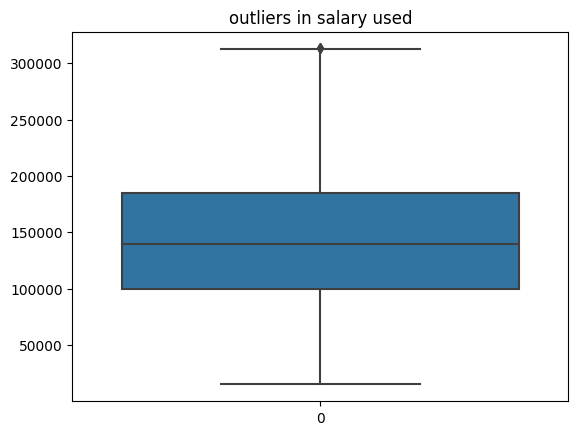

In [89]:
sns.boxplot(df['salary_in_usd']);
plt.title('outliers in salary used');

In [73]:
def ol(data):
    q3=np.percentile(data,75)
    q1=np.percentile(data,25)
    
    iqr=q3-q1
    
    ub=q3+(1.5*iqr)
    lb=q1-(1.5*iqr)
    
    return ub,lb

In [77]:
ub,lb=ol(df['salary_in_usd'])

In [78]:
df=df[(df['salary_in_usd']<=ub)&(df['salary_in_usd']>=lb)]

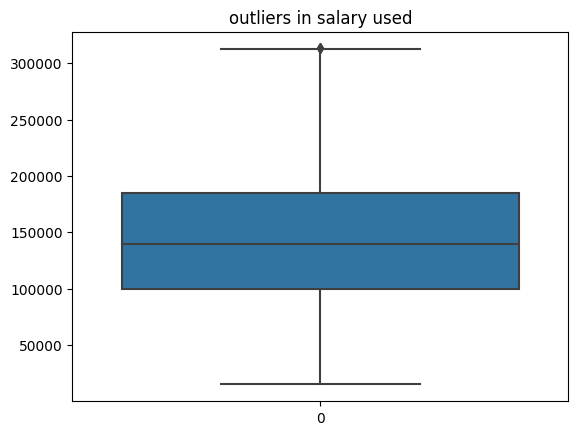

In [79]:
sns.boxplot(df['salary_in_usd']);
plt.title('outliers in salary used');

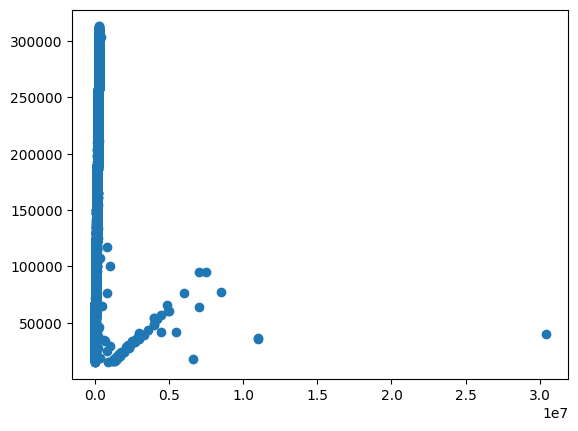

In [80]:
plt.scatter(df['salary'],df['salary_in_usd']);

In [81]:
df['salary'].max()

30400000

In [82]:
df['salary'].min()

14000

In [83]:
df['salary'].median()

140100.0

In [84]:
df['salary'].mean()

159728.89305273522

In [87]:
df.tail()

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
16528,2021,SE,FT,Data Specialist,165000,USD,165000,US,100,US,L
16530,2021,MI,FT,Principal Data Scientist,151000,USD,151000,US,100,US,L
16531,2020,EN,FT,Data Scientist,105000,USD,105000,US,100,US,S
16532,2020,EN,CT,Business Data Analyst,100000,USD,100000,US,100,US,L
16533,2021,SE,FT,Data Science Manager,7000000,INR,94665,IN,50,IN,L


In [88]:
#missing values
df.duplicated()

0        False
1        False
2        False
3        False
4        False
5        False
7        False
8        False
9        False
10       False
11       False
12       False
13       False
14       False
15       False
16       False
17       False
18       False
19       False
20       False
21       False
22       False
23       False
24       False
25       False
26       False
27       False
28       False
29       False
30       False
31       False
32       False
33       False
34       False
35       False
36       False
37       False
38       False
39       False
40       False
41       False
42       False
43       False
44       False
45       False
46       False
47       False
48       False
49       False
50       False
51       False
52       False
53       False
54       False
55       False
56       False
57       False
58       False
59       False
60       False
61       False
62        True
63       False
64       False
65       False
66       False
67       F

In [128]:
df.duplicated().sum()

6337

In [131]:
import pandas as pd
df.drop_duplicates(inplace=True)
df

/tmp/ipykernel_33/693442801.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop_duplicates(inplace=True)


,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,2024,SE,FT,AI Engineer,202730,USD,202730,US,0,US,M
1,2024,SE,FT,AI Engineer,92118,USD,92118,US,0,US,M
2,2024,SE,FT,Data Engineer,130500,USD,130500,US,0,US,M
3,2024,SE,FT,Data Engineer,96000,USD,96000,US,0,US,M
4,2024,SE,FT,Machine Learning Engineer,190000,USD,190000,US,0,US,M
5,2024,SE,FT,Machine Learning Engineer,160000,USD,160000,US,0,US,M
7,2024,MI,FT,ML Engineer,65000,USD,65000,US,0,US,M
8,2024,EN,FT,Data Analyst,101520,USD,101520,US,0,US,M
9,2024,EN,FT,Data Analyst,45864,USD,45864,US,0,US,M
10,2024,SE,FT,Data Engineer,172469,USD,172469,US,0,US,M


In [132]:
### missing values
df

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,2024,SE,FT,AI Engineer,202730,USD,202730,US,0,US,M
1,2024,SE,FT,AI Engineer,92118,USD,92118,US,0,US,M
2,2024,SE,FT,Data Engineer,130500,USD,130500,US,0,US,M
3,2024,SE,FT,Data Engineer,96000,USD,96000,US,0,US,M
4,2024,SE,FT,Machine Learning Engineer,190000,USD,190000,US,0,US,M
5,2024,SE,FT,Machine Learning Engineer,160000,USD,160000,US,0,US,M
7,2024,MI,FT,ML Engineer,65000,USD,65000,US,0,US,M
8,2024,EN,FT,Data Analyst,101520,USD,101520,US,0,US,M
9,2024,EN,FT,Data Analyst,45864,USD,45864,US,0,US,M
10,2024,SE,FT,Data Engineer,172469,USD,172469,US,0,US,M


In [133]:
df.dropna()

,work_year,experience_level,employment_type,job_title,salary,salary_currency,salary_in_usd,employee_residence,remote_ratio,company_location,company_size
0,2024,SE,FT,AI Engineer,202730,USD,202730,US,0,US,M
1,2024,SE,FT,AI Engineer,92118,USD,92118,US,0,US,M
2,2024,SE,FT,Data Engineer,130500,USD,130500,US,0,US,M
3,2024,SE,FT,Data Engineer,96000,USD,96000,US,0,US,M
4,2024,SE,FT,Machine Learning Engineer,190000,USD,190000,US,0,US,M
5,2024,SE,FT,Machine Learning Engineer,160000,USD,160000,US,0,US,M
7,2024,MI,FT,ML Engineer,65000,USD,65000,US,0,US,M
8,2024,EN,FT,Data Analyst,101520,USD,101520,US,0,US,M
9,2024,EN,FT,Data Analyst,45864,USD,45864,US,0,US,M
10,2024,SE,FT,Data Engineer,172469,USD,172469,US,0,US,M


In [134]:
df.isna().sum()

work_year             0
experience_level      0
employment_type       0
job_title             0
salary                0
salary_currency       0
salary_in_usd         0
employee_residence    0
remote_ratio          0
company_location      0
company_size          0
dtype: int64